# Hotel Cancellation Prediction

## 1) Dataset Preparation

### 1.1) Importing required libraries and general data exploration

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
import warnings
from datetime import datetime, date
import folium 
from urllib.request import urlopen
import json
import plotly.graph_objects as go
import plotly.express as px

plt.rcParams['font.size'] = 20
plt.rcParams['figure.figsize'] = 20,12
sns.set(style = 'darkgrid')

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import VarianceThreshold
warnings.filterwarnings("ignore")
%matplotlib inline
sns.set(rc={"figure.figsize": (20, 15)})
sns.set_style("whitegrid")

In [2]:
#Import data CSV
df = pd.read_csv("hotel_bookings.csv")

In [3]:
print(f'Dataset Shape: {df.shape}')

Dataset Shape: (119390, 32)


In [4]:
df.head(2)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

### 1.2) Data Cleaning

#### 1.2.1) Removing anomalies in data and columns

In [6]:
#Ada beberapa hal yang perlu dibersihkan.
# 1. Menghapus data dimana tidak ada pengunjungnya sama sekali (guest = 0)
df = df[df['adults']+df['children']+df['babies'] !=0]

#2. Menghapus data dimana nilai ADR = 0 atau nilai ADR negatif
df = df[df['adr'] > 0]

In [7]:
#Membuang kolom reservation_status dan reservation_status_date
df.drop(
    columns=['reservation_status_date', 'reservation_status'],
    axis=1,
    inplace=True
)

#### 1.2.2) Handling Missing Values

In [8]:
#Checking Dataset for null values
null_columns = df.isnull().sum().sort_values(ascending=False)
null_columns[null_columns > 0]

company     111022
agent        15387
country        467
children         4
dtype: int64

In [9]:
#Shows Percentage of Null Values
(null_columns[null_columns > 0] / len(df)).round(2)


company     0.95
agent       0.13
country     0.00
children    0.00
dtype: float64

In [10]:
#Untuk kolom company dan agent, nilai null berarti transaksi yang terjadi bukan melalui perusahaan atau agen.
#Maka, kolom company tidak di drop
def category_null(x):
    if x == 0:
        return 0
    if x != 0:
        return 1
    return x


df['company'] = df["company"].fillna(0)
df['company'] = df["company"].apply(category_null)
#Kolom Agent
df['agent'] = df["agent"].fillna(0)
df['agent'] = df["agent"].apply(category_null)
#Kolom Country
df['country'] = df["country"].fillna("No Country")
#Kolom Children
df['children'] = df['children'].fillna(0)


print(f"Company Values: \n{df['company'].value_counts()}\n")
print(f"Agent Values: \n{df['agent'].value_counts()}\n")
print(f"Children Values: \n{df['children'].value_counts()}")


df.isnull().sum().sort_values(ascending=False)



Company Values: 
0    111022
1      6377
Name: company, dtype: int64

Agent Values: 
1    102012
0     15387
Name: agent, dtype: int64

Children Values: 
0.0     108901
1.0       4807
2.0       3615
3.0         75
10.0         1
Name: children, dtype: int64


hotel                             0
is_canceled                       0
required_car_parking_spaces       0
adr                               0
customer_type                     0
days_in_waiting_list              0
company                           0
agent                             0
deposit_type                      0
booking_changes                   0
assigned_room_type                0
reserved_room_type                0
previous_bookings_not_canceled    0
previous_cancellations            0
is_repeated_guest                 0
distribution_channel              0
market_segment                    0
country                           0
meal                              0
babies                            0
children                          0
adults                            0
stays_in_week_nights              0
stays_in_weekend_nights           0
arrival_date_day_of_month         0
arrival_date_week_number          0
arrival_date_month                0
arrival_date_year           

#### 1.2.3) Handling Outliers

In [11]:
# Creating temporary numerical columns
test = df.select_dtypes(exclude=["object"])
unique_values = test.nunique().sort_values(ascending=False)
numeric_columns2 = unique_values[unique_values > 10].index
numeric_columns2 = numeric_columns2.to_list()
numeric_columns2

['adr',
 'lead_time',
 'days_in_waiting_list',
 'previous_bookings_not_canceled',
 'arrival_date_week_number',
 'arrival_date_day_of_month',
 'stays_in_week_nights',
 'booking_changes',
 'stays_in_weekend_nights',
 'previous_cancellations']

In [12]:
df[numeric_columns2].describe(percentiles=[0.25,0.50,0.75])

,adr,lead_time,days_in_waiting_list,previous_bookings_not_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_week_nights,booking_changes,stays_in_weekend_nights,previous_cancellations
count,117399.000000,117399.000000,117399.000000,117399.000000,117399.000000,117399.000000,117399.000000,117399.000000,117399.000000,117399.000000
mean,103.542124,105.094370,2.338555,0.125274,27.136091,15.802826,2.520413,0.215845,0.936064,0.086968
std,49.192931,106.913558,17.679346,1.446157,13.575037,8.783448,1.889985,0.630927,0.994577,0.848797
min,0.260000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,70.530000,19.000000,0.000000,0.000000,16.000000,8.000000,1.000000,0.000000,0.000000,0.000000
50%,95.000000,71.000000,0.000000,0.000000,27.000000,16.000000,2.000000,0.000000,1.000000,0.000000
75%,126.000000,162.000000,0.000000,0.000000,38.000000,23.000000,3.000000,0.000000,2.000000,0.000000
max,5400.000000,709.000000,391.000000,72.000000,53.000000,31.000000,50.000000,18.000000,19.000000,26.000000


In [13]:
def outlier_cap(x):
    x = x.clip(lower = x.quantile(0.25))
    x = x.clip(upper = x.quantile(0.75))
    return (x)

df[numeric_columns2] = df[numeric_columns2].apply(lambda x: outlier_cap(x))
df[numeric_columns2].describe(percentiles=[0.25,0.50,0.75])

,adr,lead_time,days_in_waiting_list,previous_bookings_not_canceled,arrival_date_week_number,arrival_date_day_of_month,stays_in_week_nights,booking_changes,stays_in_weekend_nights,previous_cancellations
count,117399.000000,117399.000000,117399.0,117399.0,117399.000000,117399.000000,117399.000000,117399.0,117399.000000,117399.0
mean,97.258657,83.830518,0.0,0.0,27.095376,15.656028,2.093195,0.0,0.881243,0.0
std,22.450606,58.579993,0.0,0.0,8.946185,6.130459,0.841010,0.0,0.852842,0.0
min,70.530000,19.000000,0.0,0.0,16.000000,8.000000,1.000000,0.0,0.000000,0.0
25%,70.530000,19.000000,0.0,0.0,16.000000,8.000000,1.000000,0.0,0.000000,0.0
50%,95.000000,71.000000,0.0,0.0,27.000000,16.000000,2.000000,0.0,1.000000,0.0
75%,126.000000,162.000000,0.0,0.0,38.000000,23.000000,3.000000,0.0,2.000000,0.0
max,126.000000,162.000000,0.0,0.0,38.000000,23.000000,3.000000,0.0,2.000000,0.0


## 2) Exploratory Data Analysis

### 2.1) Numerical Descriptive

In [14]:
df_eda = df.copy()

In [15]:
df_eda.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu').format('{:.2f}')

,count,mean,std,min,25%,50%,75%,max
is_canceled,117399.00,0.37,0.48,0.00,0.00,0.00,1.00,1.00
lead_time,117399.00,83.83,58.58,19.00,19.00,71.00,162.00,162.00
arrival_date_year,117399.00,2016.16,0.71,2015.00,2016.00,2016.00,2017.00,2017.00
arrival_date_week_number,117399.00,27.10,8.95,16.00,16.00,27.00,38.00,38.00
arrival_date_day_of_month,117399.00,15.66,6.13,8.00,8.00,16.00,23.00,23.00
stays_in_weekend_nights,117399.00,0.88,0.85,0.00,0.00,1.00,2.00,2.00
stays_in_week_nights,117399.00,2.09,0.84,1.00,1.00,2.00,3.00,3.00
adults,117399.00,1.86,0.48,0.00,2.00,2.00,2.00,4.00
children,117399.00,0.10,0.40,0.00,0.00,0.00,0.00,10.00
babies,117399.00,0.01,0.10,0.00,0.00,0.00,0.00,10.00


### 2.2) Categorical Descriptive

In [16]:
test = df_eda.describe(include='object').T
# test['freq']
test['%'] = test['freq'] / len(df_eda)
test.sort_values('%', ascending=False)

,count,unique,top,freq,%
deposit_type,117399,3,No Deposit,102650,0.874369
distribution_channel,117399,5,TA/TO,96889,0.825297
meal,117399,5,BB,90807,0.77349
customer_type,117399,4,Transient,88136,0.750739
reserved_room_type,117399,9,A,84554,0.720228
hotel,117399,2,City Hotel,78092,0.665185
assigned_room_type,117399,11,A,73208,0.623583
market_segment,117399,8,Online TA,56089,0.477764
country,117399,178,PRT,47027,0.400574
arrival_date_month,117399,12,August,13707,0.116756


### 2.3) Changing values 1 and 0 with "YES" AND " NO" in Columns [is_canceled & is_repeated_guest] for exploratory purpose

In [17]:
df_eda["is_canceled"] = df_eda["is_canceled"].replace({1:"Yes", 0:"No"})
df_eda["is_repeated_guest"] = df_eda["is_repeated_guest"].replace({1:"Yes", 0:"No"})
print(df_eda.is_canceled.unique())
print(df_eda.is_repeated_guest.unique())

['No' 'Yes']
['No' 'Yes']


### 2.4) Total bookings per Hotel Type

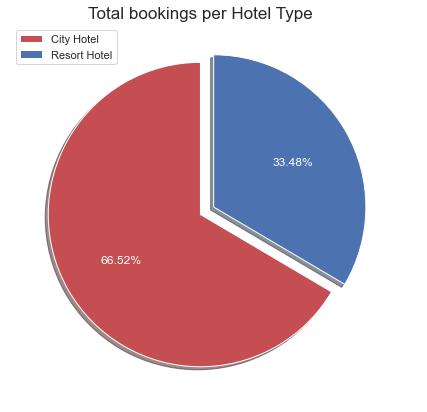

In [18]:
hotel = ["City Hotel", "Resort Hotel"]
booking = df_eda.hotel.value_counts()
color = ["r", "b"]


plt.figure(figsize = (10, 7))
plt.pie(booking, labels = hotel, colors = color, explode = (0, 0.1), textprops = {'color':"w"}, autopct = "%.2f%%", shadow = True, startangle = 90)
plt.title('Total bookings per Hotel Type', fontsize=17)
plt.legend()

plt.show();

### 2.5) Cancellation Percentage

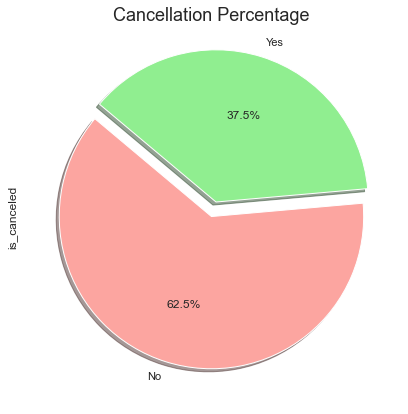

In [19]:
y = df_eda['is_canceled']

explode = [0, 0.1]

df_eda["is_canceled"].value_counts().plot(kind="pie", 
                                 autopct='%1.1f%%', 
                                 figsize=(7, 7), 
                                 explode=explode, 
                                 shadow=True, 
                                 colors = ['#FCA5A0','lightgreen'], 
                                 startangle=140)
plt.title('Cancellation Percentage', fontsize=18);

### 2.6) Hotel type breakdown

In [20]:
fig = px.histogram (df_eda, x = "hotel", color = 'is_canceled',title='Hotel Type Breakdown')
fig.show()

### 2.7) Guest type breakdown

In [21]:
fig = px.histogram (df_eda, x = 'is_repeated_guest', color = 'is_canceled', title='Guest Type Breakdown')
fig.show()

### 2.8) Top Countries with the most guests

In [22]:
vistor_df=df_eda[df_eda['is_canceled'] == "No"]['country'].value_counts().reset_index()
vistor_df.columns=['country' ,'No of guests']
vistor_df

#PRT = Portugal
#GBR = UK
#FRA = France
#ESP = Espanol
#DEU = Germany

,country,No of guests
0,PRT,19695
1,GBR,9601
2,FRA,8427
3,ESP,6312
4,DEU,6028
...,...,...
161,ZMB,1
162,SYC,1
163,CYM,1
164,SMR,1


### 2.9) Payment type breakdown

In [23]:
px.histogram(df_eda, x='deposit_type', color ='is_canceled', title='Payment Type Breakdown')

### 2.10) Distribution channel breakdown

In [24]:
px.histogram(df_eda, x = "distribution_channel", color = 'is_canceled', title="Distribution Channel Breakdown")

### 2.11) Meal Type Breakdown

In [25]:
px.histogram(df_eda, x = "meal", color = 'is_canceled', title='Meal Type Breakdown')

### 2.12) Customer Type Breakdown

In [26]:
fig = px.histogram (df_eda, x = 'customer_type', color = 'is_canceled', title='Customer Type Breakdown')
fig.show()

### 2.13) Arrival Month Breakdown

In [27]:
fig = px.histogram (df_eda, x = 'arrival_date_month', color = 'is_canceled', title='Arrival Month Breakdown'
).update_xaxes(categoryarray=["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"])
fig.show()

In [28]:
import plotly.graph_objs as go
fig = go.FigureWidget()


fig = px.histogram(df_eda, x='arrival_date_month')
fig.show()
# px.histogram(df_eda, x = 'customer_type', color = 'is_canceled', title='Customer Type Breakdown')

## 3) Data Preprocessing

### 3.1) Processing variable types and splitting variables into categorical and numerical

In [29]:
df.head(2)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
2,Resort Hotel,0,19.0,2015,July,27.0,8.0,0.0,1.0,1,...,C,0.0,No Deposit,0,0,0.0,Transient,75.0,0,0
3,Resort Hotel,0,19.0,2015,July,27.0,8.0,0.0,1.0,1,...,A,0.0,No Deposit,1,0,0.0,Transient,75.0,0,0


In [30]:
#Splitting Dataset into numerical and categorical
df_cat = df.select_dtypes(include=["object"])
df_num = df.select_dtypes(exclude=["object"])


df_num = df_num.reset_index(drop=True)
df_cat = df_cat.reset_index(drop=True)

#Adding "is_canceled" to categorical data for data preprocessing"
df_cat = pd.concat([df_cat,df_num['is_canceled']],axis=1)

print(f"List of categorical values: \n{df_cat.columns.tolist()}\n")
print(f"List of numerical values: \n{df_num.columns.tolist()}\n")

List of categorical values: 
['hotel', 'arrival_date_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'customer_type', 'is_canceled']

List of numerical values: 
['is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests']



In [31]:
#checking the shape of our numerical and categorical dataset
print(f"Total Number of Categorical Feature: \n{len(df_cat.columns)}")
print(f"Shape of Categorical Feature: \n{df_cat.shape}") 
print(f"Total Number of Numerical Feature: \n{len(df_num.columns)}")
print(f"Shape of Numerical Feature: \n{df_num.shape}") 
print(f"Total Number of Categorical + Numerical Feature: \n{len(df_num.columns) + len(df_cat.columns)}")   

Total Number of Categorical Feature: 
11
Shape of Categorical Feature: 
(117399, 11)
Total Number of Numerical Feature: 
20
Shape of Numerical Feature: 
(117399, 20)
Total Number of Categorical + Numerical Feature: 
31


### 3.2) Processing Numerical Feature

#### 3.2.1) Variance Feature Selection

In [32]:
# Removing variables with variance value below 5% (quasi-constant features where 95% of the values are similar or constant)
sel = VarianceThreshold(threshold=0.05) # 0.05: drop column where 95% of the values are constant

# fit finds the features with constant variance
sel.fit(df_num.loc[:, df_num.columns != "is_canceled"])
# Get the number of features that are not constant
print(f"Number of retained features: {sum(sel.get_support())}")
print(f"\nNumber of quasi_constant features: {len(df_num.loc[:, df_num.columns !='''is_canceled'''].columns) - sum(sel.get_support())}")

quasi_constant_features = df_num.loc[:,df_num.columns != "is_canceled"].columns[~sel.get_support()].tolist()
print(f"\nQuasi-constant features to be dropped: {quasi_constant_features}")

Number of retained features: 13

Number of quasi_constant features: 6

Quasi-constant features to be dropped: ['babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list']


In [33]:
#Dropping Quasi-Constant Variables
df_num.drop(
    columns = quasi_constant_features,
    axis= 1,
    inplace=True
)

#### 3.2.2) Correlation Feature Selection (Multicolinearity)

##### 3.2.2.1) Creating a heatmap for correlation

In [34]:
# Membuat correlation matrix
pd.options.display.float_format = "{:,.2f}".format
corr_matrix = df_num.corr(method='spearman')
corr_matrix

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,agent,company,adr,required_car_parking_spaces,total_of_special_requests
is_canceled,1.00,0.30,0.02,0.01,-0.01,-0.01,0.03,0.06,-0.00,0.10,-0.10,0.03,-0.20,-0.26
lead_time,0.30,1.00,0.06,0.11,0.01,0.15,0.26,0.18,-0.01,0.22,-0.16,-0.01,-0.14,-0.07
arrival_date_year,0.02,0.06,1.00,-0.55,0.00,0.02,0.05,0.04,0.06,-0.00,-0.00,0.22,-0.02,0.12
arrival_date_week_number,0.01,0.11,-0.55,1.00,0.05,0.02,0.02,0.02,0.00,0.03,-0.02,0.07,0.00,0.01
arrival_date_day_of_month,-0.01,0.01,0.00,0.05,1.00,-0.00,-0.01,0.00,0.02,-0.00,-0.00,0.02,0.01,0.00
stays_in_weekend_nights,-0.01,0.15,0.02,0.02,-0.00,1.00,0.15,0.13,0.05,0.13,-0.11,0.03,-0.02,0.08
stays_in_week_nights,0.03,0.26,0.05,0.02,-0.01,0.15,1.00,0.15,0.05,0.14,-0.09,0.08,-0.04,0.08
adults,0.06,0.18,0.04,0.02,0.00,0.13,0.15,1.00,0.07,0.24,-0.29,0.25,0.02,0.16
children,-0.00,-0.01,0.06,0.00,0.02,0.05,0.05,0.07,1.00,0.05,-0.06,0.25,0.06,0.10
agent,0.10,0.22,-0.00,0.03,-0.00,0.13,0.14,0.24,0.05,1.00,-0.59,0.13,-0.10,0.13


In [35]:
corr_matrix[(corr_matrix < 0.3) & (corr_matrix > -0.3)] = 0
corr_matrix

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,agent,company,adr,required_car_parking_spaces,total_of_special_requests
is_canceled,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
lead_time,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
arrival_date_year,0.00,0.00,1.00,-0.55,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
arrival_date_week_number,0.00,0.00,-0.55,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
arrival_date_day_of_month,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
stays_in_weekend_nights,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
stays_in_week_nights,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
adults,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
children,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
agent,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,-0.59,0.00,0.00,0.00


In [36]:
cancel_corr = df_num.corr()["is_canceled"]
cancel_corr.abs().sort_values(ascending=False)[1:]

lead_time                     0.28
total_of_special_requests     0.24
required_car_parking_spaces   0.20
agent                         0.10
company                       0.10
adults                        0.06
stays_in_week_nights          0.04
adr                           0.03
arrival_date_year             0.01
stays_in_weekend_nights       0.01
arrival_date_day_of_month     0.01
arrival_date_week_number      0.01
children                      0.00
Name: is_canceled, dtype: float64

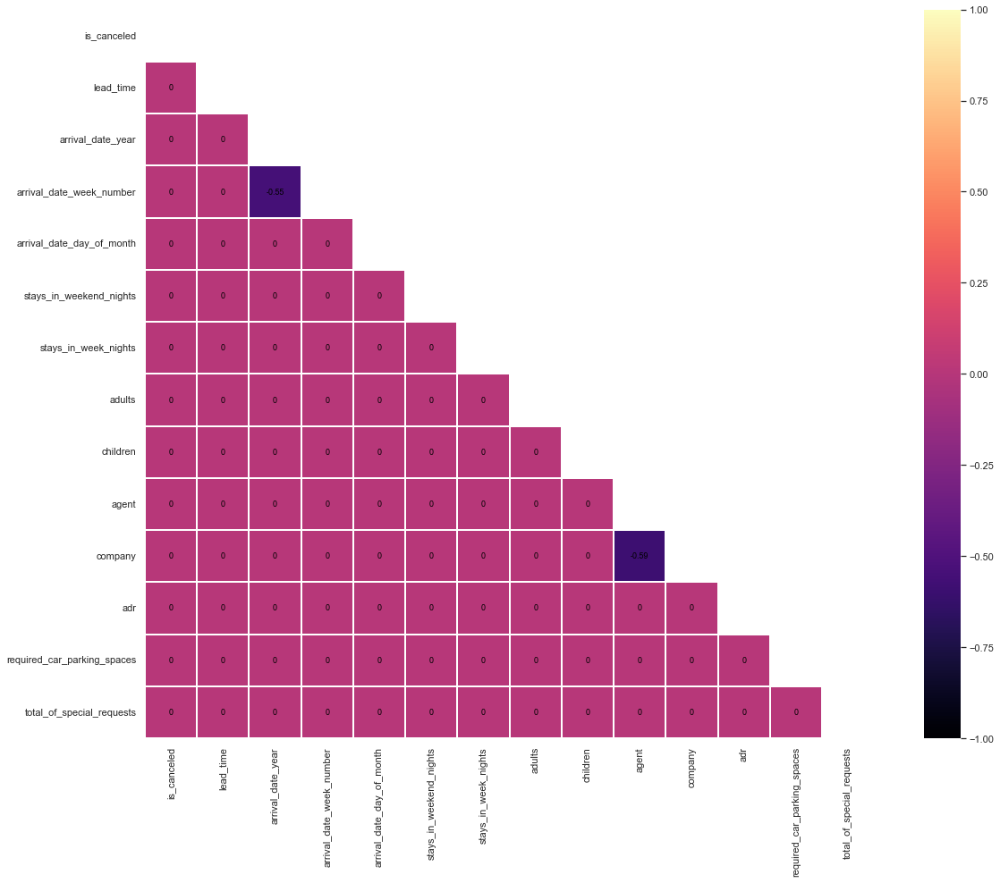

In [37]:
mask = np.triu(np.ones_like(corr_matrix, dtype=bool)) 


cmap = "magma"

# plot the heatmap
sns.heatmap( 
    data = corr_matrix, 
    mask = mask, # cover, not showing them which masked True
    vmax = 1.0, 
    vmin = -1.0, 
    linewidths = 0.1,
    annot_kws = {
        "size": 9, 
        "color": "black"
    }, 
    square = True, 
    cmap = cmap, 
    annot = True
);

##### 3.2.2.2.2) Removing variables with high multicolinearity

In [38]:
# Ada 3 Korelasi yang menunjukkan indikasi Multikolinearitas
# Menghapus feature yang bersifat multikolinearitas dengan menggunakan VIF

def calculate_vif(dataset):
    vif = pd.DataFrame()
    vif['feature'] = dataset.columns
    vif['VIF_Value'] = [variance_inflation_factor(dataset.values, i) for i in range(dataset.shape[1])]
    return vif

features = df_num
vif_df = calculate_vif(features).sort_values(by=['VIF_Value'], ascending=False)
print(vif_df)
print('\n')

# Select features with high VIF
high_vif_list = vif_df[vif_df["VIF_Value"] > 10]["feature"].tolist()

if len(high_vif_list) == 0:
    # print empty list if low multicolinearity
    print(f"None of the features have a high multicollinearity")
else:
    # print list of features with high multicolinearity
    print(f"List of features with high multicollinearity: {high_vif_list}")


                        feature  VIF_Value
2             arrival_date_year      56.38
11                          adr      23.51
7                        adults      18.92
9                         agent      12.28
3      arrival_date_week_number      10.38
6          stays_in_week_nights       7.93
4     arrival_date_day_of_month       7.54
1                     lead_time       3.72
5       stays_in_weekend_nights       2.19
0                   is_canceled       1.91
13    total_of_special_requests       1.75
10                      company       1.70
8                      children       1.14
12  required_car_parking_spaces       1.13


List of features with high multicollinearity: ['arrival_date_year', 'adr', 'adults', 'agent', 'arrival_date_week_number']


In [39]:
# Drop kolom dengan multikolinearitas tinggi
df_num.drop(
    columns=high_vif_list,
    axis=1,
    inplace=True
)

In [40]:
cancel_corr = df_num.corr()["is_canceled"]
cancel_corr.abs().sort_values(ascending=False)[1:]

lead_time                     0.28
total_of_special_requests     0.24
required_car_parking_spaces   0.20
company                       0.10
stays_in_week_nights          0.04
stays_in_weekend_nights       0.01
arrival_date_day_of_month     0.01
children                      0.00
Name: is_canceled, dtype: float64

### 3.3) Processing Categorical Variables

#### 3.3.1) Creating new variables

In [41]:
#Showing Unique Values of categorical columns
df_cat.nunique().sort_values(ascending=False)

country                 178
arrival_date_month       12
assigned_room_type       11
reserved_room_type        9
market_segment            8
meal                      5
distribution_channel      5
customer_type             4
deposit_type              3
hotel                     2
is_canceled               2
dtype: int64

In [42]:
# Creating new variable that shows if the ordered room type is the same as the room provided by hotel management
df_cat['same_room_type'] = np.where(df['assigned_room_type']== df['reserved_room_type'], 1, 0)
df_cat['same_room_type'].value_counts()

# Removing variable "assigned_room_type"
df_cat.drop(
    columns="assigned_room_type",
    axis=1,
    inplace=True
)

#### 3.3.2) Grouping categorical values with too much distinct values

In [43]:
from collections import Counter
def cumulatively_categorise(column,threshold=0.7,return_categories_list=True):
  #Find the threshold value using the percentage and number of instances in the column
  threshold_value=int(threshold*len(column))
  #Initialise an empty list for our new minimised categories
  categories_list=[]
  #Initialise a variable to calculate the sum of frequencies
  s=0
  #Create a counter dictionary of the form unique_value: frequency
  counts=Counter(column)

  #Loop through the category name and its corresponding frequency after sorting the categories by descending order of frequency
  for i,j in counts.most_common():
    #Add the frequency to the global sum
    s+=dict(counts)[i]
    #Append the category name to the list
    categories_list.append(i)
    #Check if the global sum has reached the threshold value, if so break the loop
    if s>=threshold_value:
      break
  #Append the category Other to the list
  categories_list.append('Other')

  #Replace all instances not in our new categories by Other  
  new_column=column.apply(lambda x: x if x in categories_list else 'Other')

  #Return transformed column and unique values if return_categories=True
  if(return_categories_list):
    return new_column,categories_list
  #Return only the transformed column if return_categories=False
  else:
    return new_column


#Call the function with a default threshold of 75%
df_country, categories_list = cumulatively_categorise(df_cat['country'],return_categories_list=True)
df_cat.drop(
  columns=["country"],
  axis=1,
  inplace=True
)

df_cat['country'] =  df_country

print(f"Top Countries: {df_cat['country'].unique()}")

Top Countries: ['GBR' 'PRT' 'Other' 'ESP' 'FRA' 'DEU']


#### 3.3.3) Chi Square

In [44]:
from scipy.stats import chi2_contingency

In [45]:
chi2_check = []
for i in df_cat:
    if chi2_contingency(pd.crosstab(df_cat['is_canceled'], df_cat[i]))[1] < 0.05:
        chi2_check.append('Reject Null Hypothesis')
    else:
        chi2_check.append('Fail to Reject Null Hypothesis')

df_cat_col = df_cat.columns
res = pd.DataFrame(data = [df_cat_col, chi2_check]).T
res.columns = ['Column', 'Hypothesis']
print(res)



                  Column              Hypothesis
0                  hotel  Reject Null Hypothesis
1     arrival_date_month  Reject Null Hypothesis
2                   meal  Reject Null Hypothesis
3         market_segment  Reject Null Hypothesis
4   distribution_channel  Reject Null Hypothesis
5     reserved_room_type  Reject Null Hypothesis
6           deposit_type  Reject Null Hypothesis
7          customer_type  Reject Null Hypothesis
8            is_canceled  Reject Null Hypothesis
9         same_room_type  Reject Null Hypothesis
10               country  Reject Null Hypothesis


#### 3.3.4) Countplot for categorical values

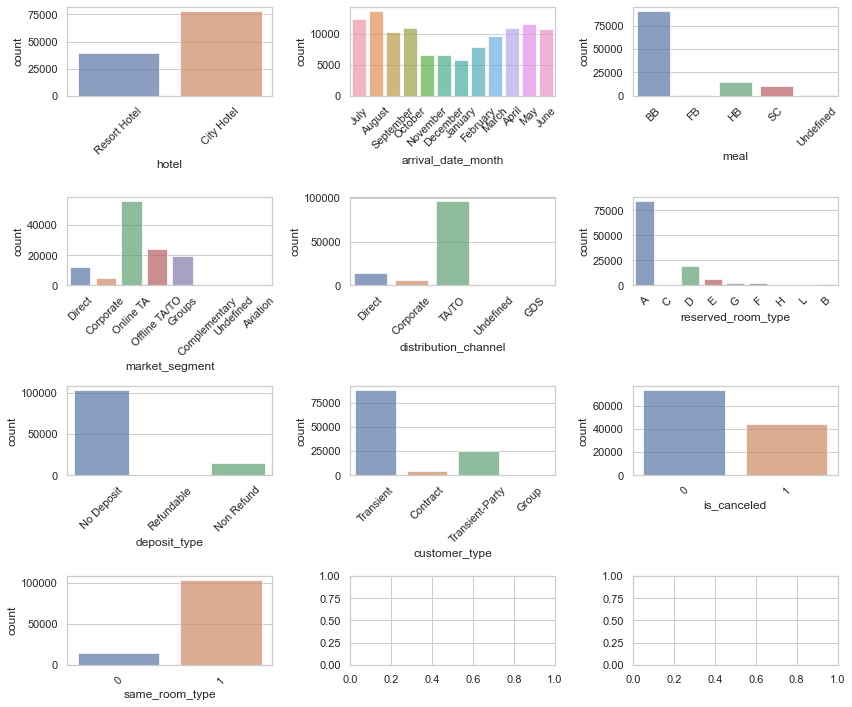

In [46]:

fig, axes = plt.subplots(
    round(len(df_cat.columns) / 3), 3, figsize=(12, 10))

for i, ax in enumerate(fig.axes):
    # plot barplot of each feature
    if i < len(df_cat.columns) - 1:
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        sns.countplot(
            x=df_cat.columns[i], alpha=0.7, data=df_cat, ax=ax)

fig.tight_layout()

## 4) Modelling

### 4.1) Prepare the data for modelling (one hot encode for categorical values and join both categorical and numerical data into one dataset)

In [47]:
from sklearn.preprocessing import OneHotEncoder
encode_list = df_cat.loc[:, (df_cat.columns != "is_canceled") & (df_cat.columns != "same_room_type")].columns
encode_list


hotel = pd.get_dummies(df_cat['hotel'])
meal = pd.get_dummies(df_cat['meal'])
market_segment = pd.get_dummies(df_cat['market_segment'])
distribution_channel = pd.get_dummies(df_cat['distribution_channel'])
deposit_type = pd.get_dummies(df_cat['deposit_type'])
customer_type = pd.get_dummies(df_cat['customer_type'])
country = pd.get_dummies(df_cat['country'])
reserved_room_type = pd.get_dummies(df_cat['reserved_room_type'])
arrival_date_month = pd.get_dummies(df_cat['arrival_date_month'])

df_cat = pd.concat([df_cat,hotel,meal,market_segment,distribution_channel,deposit_type,customer_type,country,reserved_room_type,arrival_date_month],axis=1)

# Membuang kolom original dan kolom is_cancelled untuk join nanti
df_cat.drop(
    columns= encode_list,
    axis=1,
    inplace=True
)
df_cat

,is_canceled,same_room_type,City Hotel,Resort Hotel,BB,FB,HB,SC,Undefined,Aviation,...,December,February,January,July,June,March,May,November,October,September
0,0,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,0,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117394,0,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
117395,0,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
117396,0,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
117397,0,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### 4.2) Split the data into train and test

In [48]:
# Drop kolom is_cancelled untuk di join pada saat fitting data
df_num.drop(
    columns='is_canceled',
    axis=1,
    inplace=True
)

df_model = df_num.join(df_cat)
df_model.columns

Index(['lead_time', 'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'children', 'company',
       'required_car_parking_spaces', 'total_of_special_requests',
       'is_canceled', 'same_room_type', 'City Hotel', 'Resort Hotel', 'BB',
       'FB', 'HB', 'SC', 'Undefined', 'Aviation', 'Complementary', 'Corporate',
       'Direct', 'Groups', 'Offline TA/TO', 'Online TA', 'Undefined',
       'Corporate', 'Direct', 'GDS', 'TA/TO', 'Undefined', 'No Deposit',
       'Non Refund', 'Refundable', 'Contract', 'Group', 'Transient',
       'Transient-Party', 'DEU', 'ESP', 'FRA', 'GBR', 'Other', 'PRT', 'A', 'B',
       'C', 'D', 'E', 'F', 'G', 'H', 'L', 'April', 'August', 'December',
       'February', 'January', 'July', 'June', 'March', 'May', 'November',
       'October', 'September'],
      dtype='object')

In [49]:
from sklearn.model_selection import train_test_split
x = df_model.drop(columns=['is_canceled']).copy()
y = df_model['is_canceled'].copy()
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=20)
print(len(x_train))
print(len(x_test))

93919
23480


In [50]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.125, random_state=20)
print(len(x_train))
print(len(x_test))
print(len(x_val))

82179
23480
11740


### 4.3) Import Models and Scoring Functions

In [51]:
# Fit models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm

# Scoring Functions
from sklearn.metrics import accuracy_score, precision_score, classification_report, roc_auc_score, roc_curve

### 4.4) Review best model fit accuracy

In [52]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

#### 4.4.1) Logistic Regression

In [53]:
# Fit Logistic Regression
log = LogisticRegression()
log.fit(x_train, y_train)

y_pred_log = log.predict(x_test)

prec_log = precision_score(y_test, y_pred_log)
prec_log = prec_log.round(2)*100
log_conf = confusion_matrix(y_test, y_pred_log)
log_report = classification_report(y_test, y_pred_log)

print(f"Precision Score of Logistic Regression is : {prec_log}%")
print(f"Confusion Matrix : \n{log_conf}")
print(f"Classification Report : \n{log_report}")

Precision Score of Logistic Regression is : 79.0%
Confusion Matrix : 
[[13112  1502]
 [ 3180  5686]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.80      0.90      0.85     14614
           1       0.79      0.64      0.71      8866

    accuracy                           0.80     23480
   macro avg       0.80      0.77      0.78     23480
weighted avg       0.80      0.80      0.80     23480



#### 4.4.2) Random Forest

In [54]:
# Fit Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

y_pred_rf = rf.predict(x_test)

prec_rf = precision_score(y_test, y_pred_rf)
prec_rf = prec_rf.round(4)*100
rf_conf = confusion_matrix(y_test, y_pred_rf)
rf_report = classification_report(y_test, y_pred_rf)


print(f"Precision Score of Random Forest is : {prec_rf}%")
print(f"Confusion Matrix : \n{rf_conf}")
print(f"Classification Report : \n{rf_report}")

Precision Score of Random Forest is : 84.2%
Confusion Matrix : 
[[13308  1306]
 [ 1904  6962]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.91      0.89     14614
           1       0.84      0.79      0.81      8866

    accuracy                           0.86     23480
   macro avg       0.86      0.85      0.85     23480
weighted avg       0.86      0.86      0.86     23480



#### 4.4.3) Decision Tree

In [55]:
# Fit Decision Tree
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)

y_pred_dt = dt.predict(x_test)

prec_dt = precision_score(y_test, y_pred_dt)
prec_dt = prec_dt.round(4)*100
dt_conf = confusion_matrix(y_test, y_pred_dt)
dt_report = classification_report(y_test, y_pred_dt)

print(f"Precision Score of Decision Tree is : {prec_dt}%")
print(f"Confusion Matrix : \n{dt_conf}")
print(f"Classification Report : \n{dt_report}")

Precision Score of Decision Tree is : 77.83%
Confusion Matrix : 
[[12660  1954]
 [ 2007  6859]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.87      0.86     14614
           1       0.78      0.77      0.78      8866

    accuracy                           0.83     23480
   macro avg       0.82      0.82      0.82     23480
weighted avg       0.83      0.83      0.83     23480



#### 4.4.4) K Nearest Neighbor

In [56]:
# Fit KNN
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

y_pred_knn = knn.predict(x_test)

prec_knn = precision_score(y_test, y_pred_knn)
prec_knn = prec_knn.round(4)*100
knn_conf = confusion_matrix(y_test, y_pred_knn)
knn_report = classification_report(y_test, y_pred_knn)

print(f"Precision Score of KNN is : {prec_knn}%")
print(f"Confusion Matrix : \n{knn_conf}")
print(f"Classification Report : \n{knn_report}")

Precision Score of KNN is : 75.59%
Confusion Matrix : 
[[12586  2028]
 [ 2585  6281]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.83      0.86      0.85     14614
           1       0.76      0.71      0.73      8866

    accuracy                           0.80     23480
   macro avg       0.79      0.78      0.79     23480
weighted avg       0.80      0.80      0.80     23480



In [57]:
result = {'Logistic Regression':prec_log,
        'Random Forest':prec_rf,
        'Decision Tree':prec_dt,
        'K Nearest Neighbor':prec_knn}
# df_cat_col = df_cat.columns

resultdf = pd.DataFrame(data = [result.keys(), result.values()]).T
resultdf.columns = ['Algorithms', 'Precision Score']
resultdf.sort_values(by= ['Precision Score'], ascending=False)
# print(res)

,Algorithms,Precision Score
1,Random Forest,84.20
0,Logistic Regression,79.00
2,Decision Tree,77.83
3,K Nearest Neighbor,75.59


### 4.5) Resampling to handle imbalance dataset

#### 4.5.1) Preparing the data

In [58]:
x_train = np.array(x_train)

In [59]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
x_smote, y_smote = oversample.fit_resample(x_train, y_train)

In [60]:
y_train.value_counts()

0    51407
1    30772
Name: is_canceled, dtype: int64

In [61]:
y_smote.value_counts()

0    51407
1    51407
Name: is_canceled, dtype: int64

In [62]:
# Fit all algorithm using new scaled dataset (melatih ulang RF dengan data yang sudah di SMOTE)

# Fit Logistic Regression
log_smote = LogisticRegression()
log_smote.fit(x_smote, y_smote)

# Fit KNN
knn_smote = KNeighborsClassifier()
knn_smote.fit(x_smote, y_smote)

# Fit Decision Tree
dt_smote = DecisionTreeClassifier()
dt_smote.fit(x_smote, y_smote)

# Fit Random Forest Classifier
rf_smote = RandomForestClassifier()
rf_smote.fit(x_smote, y_smote)

RandomForestClassifier()

#### 4.5.2) Review best model fit accuracy

##### 4.5.2.1) Logistic Regression (SMOTE)

In [63]:
log = LogisticRegression()
log.fit(x_train, y_train)


y_pred_log_smote = log_smote.predict(x_test)

prec_log_smote = precision_score(y_test, y_pred_log_smote)
prec_log_smote = prec_log_smote.round(4)*100
conf_log = confusion_matrix(y_test, y_pred_log_smote)
rf_report_smote = classification_report(y_test, y_pred_log_smote)

print(f"Accuracy Score of Logistic Regression (SMOTE) is : {prec_log_smote}")
print(f"Confusion Matrix : \n{conf_log}")
print(f"Classification Report : \n{rf_report_smote}")


Accuracy Score of Logistic Regression (SMOTE) is : 71.02000000000001
Confusion Matrix : 
[[11794  2820]
 [ 1956  6910]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.81      0.83     14614
           1       0.71      0.78      0.74      8866

    accuracy                           0.80     23480
   macro avg       0.78      0.79      0.79     23480
weighted avg       0.80      0.80      0.80     23480



##### 4.5.2.2) Random Forest (SMOTE)

In [64]:
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

y_pred_rf_smote = rf_smote.predict(x_test)

prec_rf_smote = precision_score(y_test, y_pred_rf_smote)
prec_rf_smote = prec_rf_smote.round(3)*100
conf = confusion_matrix(y_test, y_pred_rf_smote)
rf_report_smote = classification_report(y_test, y_pred_rf_smote)

print(f"Accuracy Score of Random Forest (Smote) is : {prec_rf_smote}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{rf_report_smote}")


Accuracy Score of Random Forest (Smote) is : 83.7
Confusion Matrix : 
[[13246  1368]
 [ 1863  7003]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.88      0.91      0.89     14614
           1       0.84      0.79      0.81      8866

    accuracy                           0.86     23480
   macro avg       0.86      0.85      0.85     23480
weighted avg       0.86      0.86      0.86     23480



##### 4.5.2.3) Decision Tree (SMOTE)

In [65]:
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)

y_pred_dt_smote = dt_smote.predict(x_test)

prec_dt_smote = precision_score(y_test, y_pred_dt_smote)
prec_dt_smote = prec_dt_smote.round(4)*100
conf_dt_smote = confusion_matrix(y_test, y_pred_dt_smote)
dt_report_smote = classification_report(y_test, y_pred_dt_smote)

print(f"Precision Score of Decision Tree (SMOTE) is : {prec_dt_smote}%")
print(f"Confusion Matrix : \n{conf_dt_smote}")
print(f"Classification Report : \n{dt_report_smote}")


Precision Score of Decision Tree (SMOTE) is : 77.81%
Confusion Matrix : 
[[12648  1966]
 [ 1974  6892]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.87      0.87     14614
           1       0.78      0.78      0.78      8866

    accuracy                           0.83     23480
   macro avg       0.82      0.82      0.82     23480
weighted avg       0.83      0.83      0.83     23480



##### 4.5.2.4) K Nearest Neighbor (SMOTE)

In [66]:
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

y_pred_knn_smote = knn_smote.predict(x_test)

prec_knn_smote = precision_score(y_test, y_pred_knn_smote)
prec_knn_smote = prec_knn_smote.round(4)*100
conf_knn_smote = confusion_matrix(y_test, y_pred_knn_smote)
knn_report_smote = classification_report(y_test, y_pred_knn_smote)

print(f"Precision Score of K Nearest Neighbor (SMOTE) is : {prec_knn_smote}%")
print(f"Confusion Matrix : \n{conf_knn_smote}")
print(f"Classification Report : \n{knn_report_smote}")


Precision Score of K Nearest Neighbor (SMOTE) is : 66.33%
Confusion Matrix : 
[[10957  3657]
 [ 1661  7205]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.75      0.80     14614
           1       0.66      0.81      0.73      8866

    accuracy                           0.77     23480
   macro avg       0.77      0.78      0.77     23480
weighted avg       0.79      0.77      0.78     23480



In [67]:
result_smote = {'Logistic Regression (SMOTE)':prec_log_smote,
        'Random Forest (SMOTE)':prec_rf_smote,
        'Decision Tree (SMOTE)':prec_dt_smote,
        'K Nearest Neighbor (SMOTE)':prec_knn_smote}
# df_cat_col = df_cat.columns

resultdf_smote = pd.DataFrame(data = [result.keys(), result.values(), result_smote.values()]).T
resultdf_smote.columns = ['Algorithms', 'Precision Score', 'Precision Score (SMOTE)']
resultdf_smote.sort_values(by= ['Precision Score'], ascending=False).reset_index(drop=True)
# print(res)

,Algorithms,Precision Score,Precision Score (SMOTE)
0,Random Forest,84.20,83.70
1,Logistic Regression,79.00,71.02
2,Decision Tree,77.83,77.81
3,K Nearest Neighbor,75.59,66.33
